<a href="https://colab.research.google.com/github/PacktPublishing/Hands-On-Computer-Vision-with-PyTorch/blob/master/Chapter10/Multi_object_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi Object Instance Segmentation
we'll be using the [Detectron2](https://ai.facebook.com/blog/-detectron2-a-pytorch-based-modular-object-detection-library-/) framework for multi object instance segmentation using the Google Open Images Dataset.

## About Detectron2
Detectron2 is a platform built by the Facebook team. Detectron2 includes high-quality implementations of state-of-the-art object detection algorithms, including DensePose of the Mask R-CNN model family. The original Detectron framework was written in Caffe2, while the Detectron2 framework is written using PyTorch.
Detectron2 supports a range of tasks related to object detection. Like the original Detectron, it supports object detection with boxes and instance segmentation masks, as well as human pose prediction. Beyond that, Detectron2 adds support for semantic segmentation and panoptic segmentation (a task that combines both semantic and instance segmentation). By leveraging Detectron2, we are able to build object detection, segmentation, and pose estimation in a few lines of code.


In [ ]:
# installing the required packages. comment out if already done so
# !pip install -qU openimages torch_snippets

In [1]:
from torch_snippets import *

# downloading the required annotation files
# !wget -O train-annotations-object-segmentation.csv -q https://storage.googleapis.com/openimages/v5/train-annotations-object-segmentation.csv
# !wget -O classes.csv -q https://raw.githubusercontent.com/openimages/dataset/master/dict.csv 

In [2]:
# Specify the classes that we want our model to predict
required_classes = 'person,dog,bird,car,elephant,football,jug,laptop,Mushroom,Pizza,Rocket,Shirt,Traffic sign,Watermelon,Zebra'
required_classes = [c.lower() for c in required_classes.lower().split(',')]

classes = pd.read_csv('classes.csv', header=None)
classes.columns = ['class','class_name']
classes = classes[classes['class_name'].map(lambda x: x in required_classes)]

In [3]:
classes

,class,class_name
43,/m/01226z,football
224,/m/015p6,bird
601,/m/01c648,laptop
753,/m/01g317,person
1022,/m/01mqdt,traffic sign
1045,/m/01n4qj,shirt
2819,/m/02vx4,football
4675,/m/052sf,mushroom
5181,/m/0663v,pizza
5916,/m/0898b,zebra


Fetch the image IDs and masks corresponding to `required_classes`:  
Given the vast amount of data, we are only fetching 500 images per class in subset_data. It is up to you whether you fetch a smaller or larger set of files per class and the list of unique classes (required_classes).

In [5]:
from torch_snippets import *
df = pd.read_csv('train-annotations-object-segmentation.csv')
df.head()

data = pd.merge(df, classes, left_on='LabelName', right_on='class')

subset_data = data.groupby('class_name').agg({'ImageID': lambda x: list(x)[:500]})
subset_data = flatten(subset_data.ImageID.tolist())
subset_data = data[data['ImageID'].map(lambda x: x in subset_data)]
subset_masks = subset_data['MaskPath'].tolist()

In [11]:
print(len(subset_masks))
subset_masks[0]

14090


'e9a7da5ff1fd56df_m01g317_1803811b.png'

In [15]:
print(len(subset_data))
subset_data.head()

14090


,MaskPath,ImageID,LabelName,BoxID,BoxXMin,BoxXMax,BoxYMin,BoxYMax,PredictedIoU,Clicks,class,class_name
0,e9a7da5ff1fd56df_m01g317_1803811b.png,e9a7da5ff1fd56df,/m/01g317,1803811b,0.468125,0.628750,0.188714,0.949121,0.86841,0.47513 0.38255 1;0.52118 0.91333 0;0.47513 0....,/m/01g317,person
1,18c1fd8342d55af8_m01g317_a9a97702.png,18c1fd8342d55af8,/m/01g317,a9a97702,0.394375,0.605000,0.241667,0.903333,0.81242,0.57036 0.81358 1;0.54599 0.65655 0;0.42280 0....,/m/01g317,person
2,42ea7facefea9a28_m01g317_333376e6.png,42ea7facefea9a28,/m/01g317,333376e6,0.791875,0.839375,0.096226,0.184906,0.64984,0.79876 0.17372 1;0.84756 0.19868 1;0.80936 0....,/m/01g317,person
3,bcb123bf7f256b1c_m01g317_a42b01bc.png,bcb123bf7f256b1c,/m/01g317,a42b01bc,0.478125,0.518750,0.450797,0.604499,0.77027,0.49924 0.57654 0;0.50731 0.45367 1;0.49108 0....,/m/01g317,person
4,a2bb5944e071223c_m01g317_7ef4ab8d.png,a2bb5944e071223c,/m/01g317,7ef4ab8d,0.738750,0.861250,0.508333,0.631667,0.71815,0.79186 0.54778 0;0.80219 0.52627 1;0.84317 0....,/m/01g317,person


So far, we only have the `ImageId` and `MaskPath` values corresponding to an image. In the next steps, we will go ahead and download the actual images and masks from open-images.  
Open Images has 16 ZIP files for training masks. Each ZIP file will have only a few masks from subset_masks, so we will delete the rest after moving the required masks into a separate folder. This download -> move -> delete action will keep the memory footprint relatively small. We will have to run this step once for each of the 16 files:  
Note that the following code is commented out since we've already done that...

In [9]:
# !mkdir -p masks
# for c in Tqdm('0123456789abcdef'):
#     !wget -q https://storage.googleapis.com/openimages/v5/train-masks/train-masks-{c}.zip
#     !unzip -q train-masks-{c}.zip -d tmp_masks
#     !rm train-masks-{c}.zip
#     tmp_masks = Glob('tmp_masks', silent=True)
#     items = [(m,fname(m)) for m in tmp_masks]
#     items = [(i,j) for (i,j) in items if j in subset_masks]
#     for i,j in items:
#         os.rename(i, f'masks/{j}')
#     !rm -rf tmp_masks
!ls

3d-object-detection.md	    images
classes.csv		    images.json
crowd_counting.ipynb	    Multi_object_segmentation.ipynb
data.zip		    output
Human_pose_detection.ipynb  train
Image_colorization.ipynb    train-annotations-object-segmentation.csv


Download the images corresponding to ImageId:

In [ ]:
# masks = Glob('masks')
# masks = [fname(mask) for mask in masks]

# subset_data = subset_data[subset_data['MaskPath'].map(lambda x: x in masks)]
# subset_imageIds = subset_data['ImageID'].tolist()

# from openimages.download import _download_images_by_id
# !mkdir images
# _download_images_by_id(subset_imageIds, 'train', './images/')

Zip all the images, masks, and ground truths and save them – just in case your session crashes, it is helpful to save and retrieve the file for later training. Once the ZIP file is created, ensure you save the file in your drive or download it. 

In [ ]:
# import zipfile
# files = Glob('images') + Glob('masks') + ['train-annotations-object-segmentation.csv', 'classes.csv']
# with zipfile.ZipFile('data.zip','w') as zipme:
#     for file in Tqdm(files):
#         zipme.write(file, compress_type=zipfile.ZIP_DEFLATED)

Finally, move the data into a single directory

In [ ]:
# !mkdir -p train/
# !mv images train/myData2020
# !mv masks train/annotations

Given that there are so many moving components in object detection code, as a way of standardization, Detectron accepts a rigid data format for training. While it is possible to write a dataset definition and feed it to Detectron, it is easier (and more profitable) to save the entire training data in COCO format. This way, you can leverage other training algorithms, such as detectron transformers (DETR), with no change to the data whatsoever.  
First, we will start by defining the categories of classes.

In [16]:
# !pip install git+https://github.com/waspinator/pycococreator.git@0.2.0
import datetime

INFO = {
    "description": "MyData2020",
    "url": "None",
    "version": "1.0",
    "year": 2020,
    "contributor": "sizhky",
    "date_created": datetime.datetime.utcnow().isoformat(' ')
}


LICENSES = [
    {
        "id": 1,
        "name": "MIT"
    }
]

CATEGORIES = [{'id': id+1, 'name': name.replace('/',''), 'supercategory': 'none'} for id,(_,(name, clss_name)) in enumerate(classes.iterrows())]

in the definition of `CATEGORIES`, we are creating a new key called supercategory. To understand supercategory, let's go through an example: the Man and Woman classes are categories belonging to the Person supercategory. In our case, given that we are not interested in supercategories, we will specify it as `none`.

In [19]:
CATEGORIES
# classes

[{'id': 1, 'name': 'm01226z', 'supercategory': 'none'},
 {'id': 2, 'name': 'm015p6', 'supercategory': 'none'},
 {'id': 3, 'name': 'm01c648', 'supercategory': 'none'},
 {'id': 4, 'name': 'm01g317', 'supercategory': 'none'},
 {'id': 5, 'name': 'm01mqdt', 'supercategory': 'none'},
 {'id': 6, 'name': 'm01n4qj', 'supercategory': 'none'},
 {'id': 7, 'name': 'm02vx4', 'supercategory': 'none'},
 {'id': 8, 'name': 'm052sf', 'supercategory': 'none'},
 {'id': 9, 'name': 'm0663v', 'supercategory': 'none'},
 {'id': 10, 'name': 'm0898b', 'supercategory': 'none'},
 {'id': 11, 'name': 'm08hvt4', 'supercategory': 'none'},
 {'id': 12, 'name': 'm09rvcxw', 'supercategory': 'none'},
 {'id': 13, 'name': 'm0bt9lr', 'supercategory': 'none'},
 {'id': 14, 'name': 'm0bwd_0j', 'supercategory': 'none'},
 {'id': 15, 'name': 'm0kpqd', 'supercategory': 'none'}]

Import the relevant packages and create an empty dictionary with the keys needed to save the COCO JSON file:

In [20]:
# !pip install pycocotools
from pycococreatortools import pycococreatortools
from os import listdir
from os.path import isfile, join
from PIL import Image

coco_output = {
    "info": INFO,
    "licenses": LICENSES,
    "categories": CATEGORIES,
    "images": [],
    "annotations": []
}

Set a few variables in place that contain the information on the image locations and annotation file locations:

In [21]:
ROOT_DIR = "train"
IMAGE_DIR, ANNOTATION_DIR = 'train/myData2020/', 'train/annotations/'
image_files = [f for f in listdir(IMAGE_DIR) if isfile(join(IMAGE_DIR, f))]
annotation_files = [f for f in listdir(ANNOTATION_DIR) if isfile(join(ANNOTATION_DIR, f))]

Loop through each image filename and populate the images key in the coco_output dictionary

In [22]:
image_id = 1
# go through each image
for image_filename in Tqdm(image_files):
    image = Image.open(IMAGE_DIR + '/' + image_filename)
    image_info = pycococreatortools.create_image_info(image_id, os.path.basename(image_filename), image.size)
    coco_output["images"].append(image_info)
    image_id = image_id + 1

100%|██████████| 5913/5913 [00:00<00:00, 17201.98it/s]


Loop through each segmentation annotation and populate the annotations key in the coco_output dictionary

In [23]:
segmentation_id = 1
for annotation_filename in Tqdm(annotation_files):
    image_id = [f for f in coco_output['images'] if stem(f['file_name'])==annotation_filename.split('_')[0]][0]['id']
    class_id = [x['id'] for x in CATEGORIES if x['name'] in annotation_filename][0]
    category_info = {'id': class_id, 'is_crowd': 'crowd' in image_filename}
    binary_mask = np.asarray(Image.open(f'{ANNOTATION_DIR}/{annotation_filename}').convert('1')).astype(np.uint8)
 
    annotation_info = pycococreatortools.create_annotation_info(segmentation_id, image_id, category_info, binary_mask, image.size, tolerance=2)

    if annotation_info is not None:
        coco_output["annotations"].append(annotation_info)
        segmentation_id = segmentation_id + 1

  0%|          | 6/14090 [00:00<09:17, 25.24it/s]/home/guy/anaconda3/envs/ptvit/lib/python3.8/site-packages/pycococreatortools/pycococreatortools.py:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  contours = np.subtract(contours, 1)
100%|██████████| 14090/14090 [09:21<00:00, 25.08it/s]


In [24]:
coco_output['categories'] = [{'id': id+1, 'name': clss_name, 'supercategory': 'none'} for id,(_,(name, clss_name)) in enumerate(classes.iterrows())]

import json
with open('images.json', 'w') as output_json_file:
    json.dump(coco_output, output_json_file)

In [ ]:
# !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
# !pip install pyyaml==5.1 pycocotools>=2.0.1

In [4]:
from torch_snippets import *
required_classes = 'person,dog,bird,car,elephant,football,jug,laptop,Mushroom,Pizza,Rocket,Shirt,Traffic sign,Watermelon,Zebra'
required_classes = [c.lower() for c in required_classes.lower().split(',')]

classes = pd.read_csv('classes.csv', header=None)
classes.columns = ['class','class_name']
classes = classes[classes['class_name'].map(lambda x: x in required_classes)]

In [2]:
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer

In [27]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("dataset_train", {}, "images.json", "train/myData2020")

In [5]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml") # pretrained weights
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025 # pick a good LR
cfg.SOLVER.MAX_ITER = 5000 # instead of epochs, we train on 5000 batches
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes) 

In [29]:
cfg.OUTPUT_DIR

'./output'

In [30]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

RuntimeError: Unexpected error from cudaGetDeviceCount(). Did you run some cuda functions before calling NumCudaDevices() that might have already set an error? Error 804: forward compatibility was attempted on non supported HW

In [16]:
!cp output/model_final.pth output/trained_model_2.pth

/home/guy/anaconda3/envs/ptvit/lib/python3.8/site-packages/torch-1.10.1-py3.8-linux-x86_64.egg/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


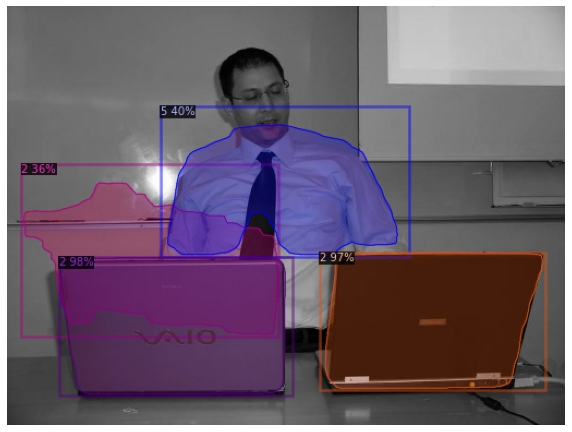

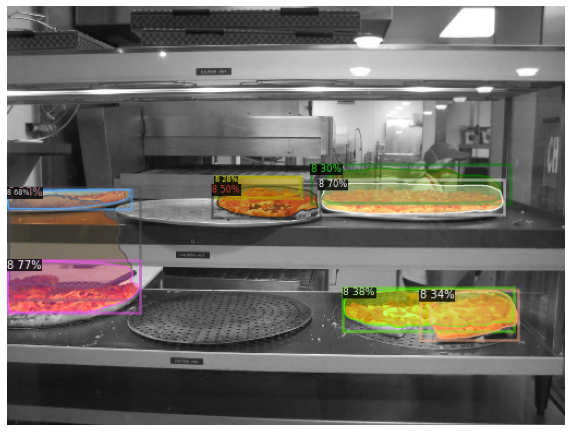

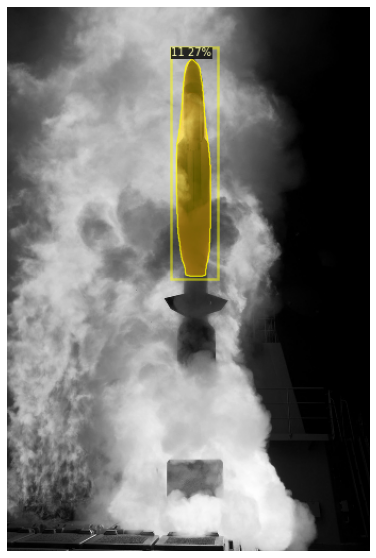

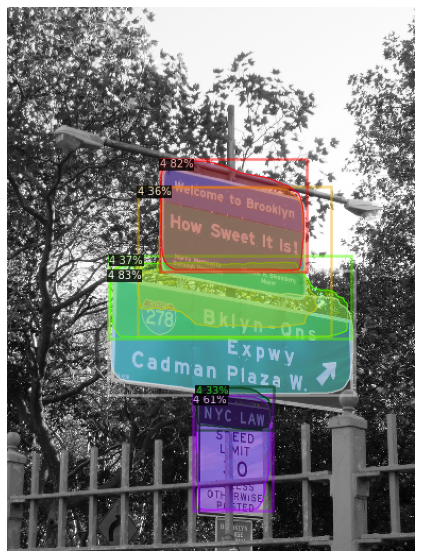

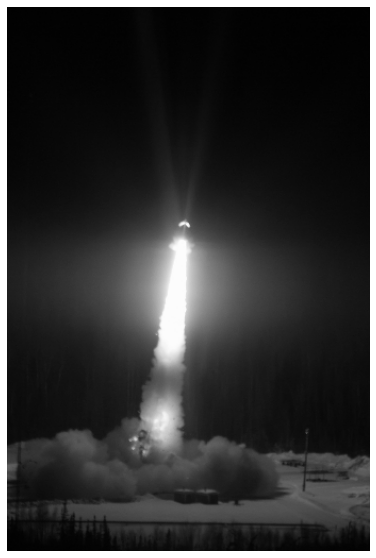

...

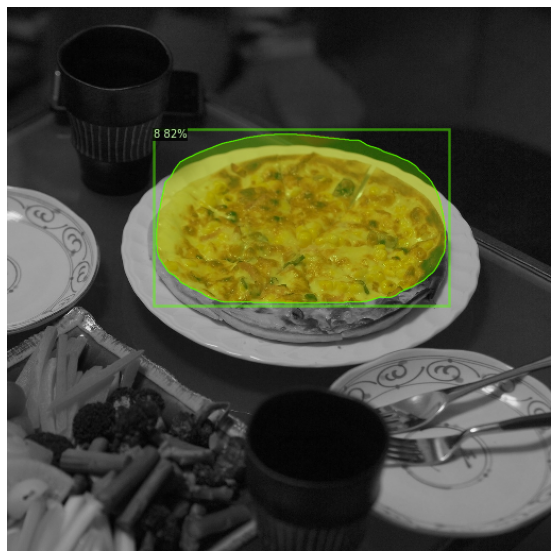

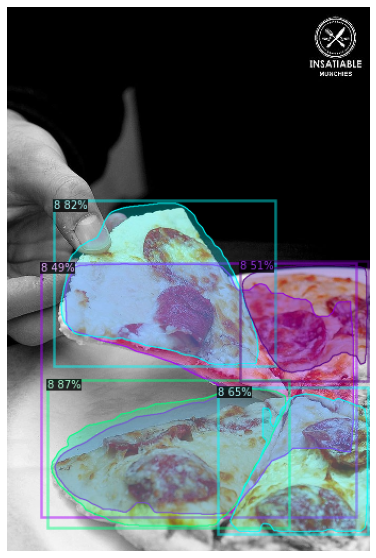

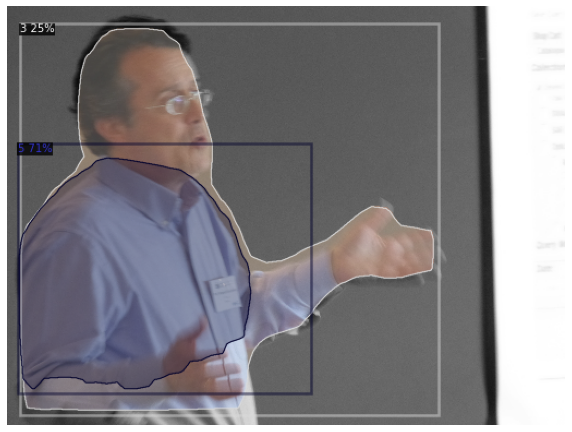

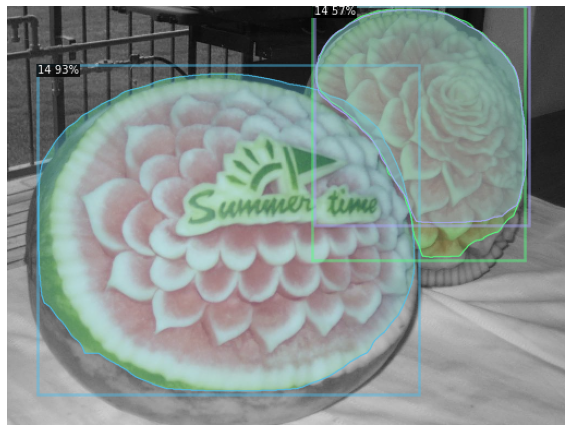

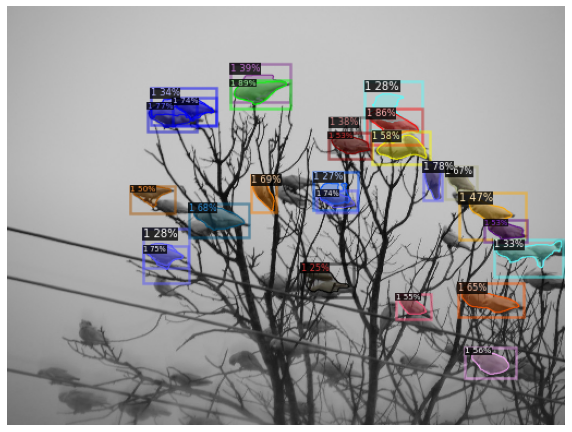

In [6]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "trained_model.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25
predictor = DefaultPredictor(cfg)
from detectron2.utils.visualizer import ColorMode
files = Glob('train/myData2020')
for _ in range(30):
    im = cv2.imread(str(choose(files)))
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                    scale=0.5,
                    metadata=MetadataCatalog.get("dataset_train"),
                    instance_mode=ColorMode.IMAGE_BW 
# remove the colors of unsegmented pixels. 
# This option is only available for segmentation models
    )

    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    show(out.get_image())

In [7]:
classes

,class,class_name
43,/m/01226z,football
224,/m/015p6,bird
601,/m/01c648,laptop
753,/m/01g317,person
1022,/m/01mqdt,traffic sign
1045,/m/01n4qj,shirt
2819,/m/02vx4,football
4675,/m/052sf,mushroom
5181,/m/0663v,pizza
5916,/m/0898b,zebra
